# Syntethic dataset example

- Real LFP
- Inlcude additional plots (row correlation)

- Dataset LAVADE
- Dataset section
- Dagtaset comb

- Move derivation of derivatives to SI

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as clr

import seaborn as sns

from sklearn import preprocessing
from sklearn.linear_model import Ridge
from sklearn.cross_decomposition import PLSRegression

import random
# Initialize the random seed to ensure reproducibility of the results in the paper
random.seed(10)

# Test your implementations of the skewness and kurtosis etc. 
from scipy.stats import skew
from scipy.stats import kurtosis

from jax import jacfwd
import jax.numpy as jnp

import src.featlin
from src.featlin import regress_linearized_coeff
from src.featlin import jax_moment
from src.featlin import linearization_plots

In [2]:
# Generate synthetic data

def generate_wide_datamatrix(fun, range_x, range_m, columns, rows, snr_x=-1):
    '''This function generates synthethic data to test the linearization methodology. 
    fun: function that is defined for all values inside range. Representing a measurement that was taken from any process. 
    range_x: np.array with two elements, the first being strictly smaller than the second, defining the meaning of the columsn
    range_m: range of factor
        each row of x is equal to m*fun(x), where m is sampled from a uniform distribution
    datapoints: number of linearly spaced datapoints for evaluating fun, equal to number of columns of X
    rows: number of rows of X, i.e. 
    snr_x: Signal to noise ratio of AWGN to be added on the signal, if -1, then this functions adds no noise to the signal
    Returns: X
    '''

    # Sample m
    m = np.random.uniform(low=range_m[0], high=range_m[1], size=rows)

    # create X and y
    x = np.linspace(range_x[0], range_x[1], columns)
    fun_values = fun(x)
    X = np.zeros([rows, columns])
    y = np.zeros(rows)
    for i in range(rows):
        row_i = m[i]*fun_values
        if snr_x != -1: 
            # Add Gaussian noise to the measurements
            # Snippet below partly copied/adapted/inspired by: 
            # https://stackoverflow.com/questions/14058340/adding-noise-to-a-signal-in-python
            # Answer from Noel Evans, accessed: 18.05.2022, 15:37 CET
            # Calculate signal power and convert to dB 
            sig_avg_watts = np.mean(row_i**2)
            sig_avg_db = 10 * np.log10(sig_avg_watts)
            # Calculate noise according to [2] then convert to watts
            noise_avg_db = sig_avg_db - snr_x
            noise_avg_watts = 10 ** (noise_avg_db / 10)
            # Generate an sample of white noise
            mean_noise = 0
            noise = np.random.normal(mean_noise, np.sqrt(noise_avg_watts), columns)
            # Noise up the original signal
            row_i += noise

        X[i, :] = row_i

    return np.array(X), x

def generate_target_values(X, targetfun, percentage_range_x_to_t=[0,1]):
    '''This function takes the wide data matix X as an input and generates target function values y based on the defined functions
    X: \in R^mxn with n>>m (wide data matrix, used as input for the targetfunction y
    targetfun: Underlying relationship between X and y. This can be any function from R^n -> R^1
        This is also the ideal feature for predicting y and thus the information we would like to discover by applying the lionearization methodology. 
    percentage_range_x_to_t: array with two elements, the first one being strictly smaller than the second value, both being strcitly between 0 and 1, 
        defines the range of input data that shall be used to generate the target function
        The reson behind this is that in process data analytics often a sitation can arise where only a part of the data is relevant to predict the target y  
    '''
    rows = X.shape[0]
    columns = X.shape[1]
    y = np.zeros([rows])
    for i in range(rows):
        row_i = X[i, :]
        low_ind = int(percentage_range_x_to_t[0]*columns)
        high_ind = int(percentage_range_x_to_t[1]*columns)
        y[i] = targetfun(row_i[low_ind:high_ind])
    
    return y

In [3]:
#@RDB: JS: This is all a little bit random. Do you have better ideas what we could do? Something that is motivated by a real system and also relevant? 

# Implement battery data here and showcase it for the case of a known relationship 
#   (aka. if X is this from the real world, where many things are simply not that gaussian, and we assume that y is produced by this underlying function (add noise to y), 
#   then our method does this and that

# Somewhat arbitrary functions to represent some quantity we were able to measure
fun_meas = [
    lambda a : a,
    lambda a : a**2,
    ]

fmeas_names = [
    'linear',
    'quadratic',
    'log'
    ]
    
# True underlying relationship between the measurements and some quantity we ewould like to recover/predict from measurements
fun_target = [
    lambda a : np.mean(a),
    lambda a : np.sum(a**2),
    lambda a : np.var(a),
    lambda a : skew(a),
    lambda a : kurtosis(a),
    ]

# JAX numpy wrapper target function  to allow for autodifferentiation
fun_targetj = [
    lambda a : jnp.mean(a),
    lambda a : jnp.sum(a**2),
    lambda a : jnp.var(a),
    lambda x: jax_moment(x,3)/((jax_moment(x,2))**(3/2)),
    lambda x: jax_moment(x,4)/(jax_moment(x,2)**2)-3
    ]
    #lambda a : jnp.sum(jnp.sqrt(a))

fun_target_names = [
    'Sum',
    'Sum of Squares',
    'Variance', 
    'Skewness',
    'Kurtosis',
    ]

# What if the relationship is actually a combination fo different functions
# Combinations based of the functions above to obtain non-linear functions of different complexity
# This is expected to show limits of the methodology
fun_target_comb = [
    lambda  a : 5*fun_target[0](a) + fun_target[1](a),
    lambda  a : 3*fun_target[2](a) + fun_target[0](a),
    lambda  a : fun_target[2](a) * fun_target[4](a),
    lambda  a : fun_target[1](a) * fun_target[5](a)
    ]
fun_target_combj = [
    lambda  a : 5*fun_targetj[0](a) + fun_targetj[1](a),
    lambda  a : 3*fun_targetj[2](a) + fun_targetj[0](a),
    lambda  a : fun_targetj[1](a) * fun_targetj[3](a),
    lambda  a : fun_targetj[3](a) * fun_targetj[4](a)
    ]
ftarget_comb_names = [
    '5*\sum_{i=1}^n x_i + \sum_{i=1}^n x_i^2',
    '3*\text{var}(\mathbf{x}) + \sum_{i=1}^n x_i',
    '\sum_{i=1}^n x_i^2 * \text{skewness}(\mathbf{x})',
    '\text{skewneww}(\mathbf{x}) * \text{kurtosis}(\mathbf{x})'
]

In [4]:
# Generate the data matrices X here
columns = 500 
rows = 100
input_data_sets = 2*len(fun_meas)

X = np.zeros([rows, columns, input_data_sets])
y = np.zeros([rows, 5, input_data_sets])
y_range = np.zeros([rows, 5, input_data_sets])
y_combf = np.zeros([rows, 4, input_data_sets])
y_combf_range = np.zeros([rows, 4, input_data_sets])

for i in range(len(fun_meas)):
    X[:, :, i], x = generate_wide_datamatrix(fun_meas[i], [-1, 10], [-1, 10], columns, rows, snr_x=-1)
    X[:, :, i+len(fun_meas)], x = generate_wide_datamatrix(fun_meas[i], [-1, 10], [-1, 10], columns, rows, snr_x=40)

    for j in range(len(fun_targetj)): 
        y[:, j, i] = generate_target_values(X[:, :, i], fun_targetj[j], percentage_range_x_to_t=[0,1])
        y[:, j, i+len(fun_meas)] = generate_target_values(X[:, :, i+len(fun_meas)], fun_targetj[j], percentage_range_x_to_t=[0,1])

    for j in range(len(fun_targetj)): 
        y_range[:, j, i] = generate_target_values(X[:, :, i], fun_targetj[j], percentage_range_x_to_t=[0.25, 0.6])
        y_range[:, j, i+len(fun_meas)] = generate_target_values(X[:, :, i+len(fun_meas)], fun_targetj[j], percentage_range_x_to_t=[0.25, 0.6])

    for j in range(len(fun_target_combj)): 
        y_combf[:, j, i] = generate_target_values(X[:, :, i], fun_target_combj[j], percentage_range_x_to_t=[0.1, 0.6])
        y_combf[:, j, i+len(fun_meas)] = generate_target_values(X[:, :, i+len(fun_meas)], fun_target_combj[j], percentage_range_x_to_t=[0.1, 0.6])

    for j in range(len(fun_target_combj)): 
        y_combf_range[:, j, i] = generate_target_values(X[:, :, i], fun_target_combj[j], percentage_range_x_to_t=[0.25, 0.6])
        y_combf_range[:, j, i+len(fun_meas)] = generate_target_values(X[:, :, i]+len(fun_meas), fun_target_combj[j], percentage_range_x_to_t=[0.25, 0.6])

# Generate the matrix X here, strcitly positive values, the need for this was removed by commenting out the funcions that are undefined for negative values
# Xp, xp, yp = generate_wide_datamatrix(fun_meas[-1], [np.finfo(float).eps, 10], [np.finfo(float).eps, 10], columns, rows, snr_x=100)

# Calculate the corresponding linearized regression coefficients

# In here test the method for one
# Learned regression coeffciients vs linearized regression coefficient comparison
# PLS model as reference

train_frac = 0.7
t_ind = int(train_frac*X.shape[0])
X_train_ = X[:t_ind, :, :]
y_train_ = y[:t_ind, :, :]
X_test_ = X[t_ind:, :, :]
y_test_ = y[t_ind:, :, :]

In [43]:
# Load the LFP Dataset
lfp_df = pd.read_csv('lfp_slim.csv', index_col=0)

X_lfp = np.array(lfp_df.iloc[:, 0:1000])
X_lfp = X_lfp[:, ::-1]
y_lfp_true = np.array(lfp_df.iloc[:, 1000])
x_lfp = np.linspace(2.0, 3.5, 1000)

X_lfp_train = np.array(X_lfp[lfp_df.iloc[:, 1002]==0, :])
y_lfp_train_true = np.array(y_lfp_true[lfp_df.iloc[:, 1002]==0])
X_lfp_test = np.array(X_lfp[lfp_df.iloc[:, 1002]==1, :])
y_lfp_test_true = np.array(y_lfp_true[lfp_df.iloc[:, 1002]==1])
X_lfp_test2 = np.array(X_lfp[lfp_df.iloc[:, 1002]==2, :])
y_lfp_test2_true = np.array(y_lfp_true[lfp_df.iloc[:, 1002]==2])

y_lfp_train = np.zeros([X_lfp_train.shape[0], 5, 1])
for j in range(len(fun_targetj)): 
    y_lfp_train[:, j, 0] = generate_target_values(X_lfp_train[:, :], fun_targetj[j], percentage_range_x_to_t=[0,1])


In [6]:
# Colorblind safe palette from: https://gka.github.io/palettes/#/26|s|00429d,96ffea,ffffe0|ffffe0,ff005e,93003a|1|1
# 

# Previously I used, but not good for colorblind people.
# cmap = sns.color_palette("icefire", as_cmap=True)
# colors = [
#    '#00429d', '#1649a0', '#2351a4', '#2d58a7', 
#    '#3660ab', '#3e67ae', '#456fb2', '#4d77b5', 
#    '#547fb8', '#5b87bb', '#618fbf', '#6896c2', 
#    '#6f9ec5', '#77a6c8', '#7eafcb', '#85b7ce', 
#    '#8dbfd1', '#95c7d3', '#9ecfd6', '#a7d7d8', 
#    '#b1dfdb', '#bbe6dd', '#c7eedf', '#d4f5e0', 
#    '#e5fbe1', '#ffffe0'] 

# colors = ['#332bb3', '#3936b9', '#423fbd', '#4e47bf', '#5b4dbf', '#6953be', '#7657bb', '#845cb7', '#915fb2', '#9e63ad', '#aa66a6', '#b56a9f', '#c06e97', '#ca738f', '#d37887', '#dc7e7e', '#e48575', '#eb8d6d', '#f19764', '#f7a25b']
colors = ['#332bb3', '#4a31b5', '#5d37b6', '#6d3db7', '#7c43b7', '#8a49b6', '#964fb5', '#a256b3', '#ad5db1', '#b764b0', '#c16cae', '#ca75ad', '#d27eac', '#d989ab', '#e094aa', '#e7a1ab', '#ecafac', '#f0beae', '#f4cfb0', '#f6e1b4']
# colors = ['#00006a', '#280a76', '#411681', '#561f8b', '#692893', '#7c3099', '#8d379f', '#9e3ea2', '#ad46a5', '#bc4ea6', '#c956a6', '#d560a6', '#e06aa4', '#ea76a1', '#f2839d', '#f99299', '#fea393', '#ffb58d', '#ffc985', '#ffdf7b']

cmap = clr.LinearSegmentedColormap.from_list('Blue-light cb-safe', colors, N=256)

color_list = ['#0051a2', '#97964a', '#f4777f', '#93003a']

In [7]:
# Correlation between the training and the test dataset

# Calculate the correlation between the rows of the trainign and the rows of the test dataset. 

#

# X_lfp_train_df = pd.DataFrame(X_lfp_train[:, ::5].T)
# X_lfp_df = pd.DataFrame(X_lfp[:, ::5].T)
# X_lfp_test_df = pd.DataFrame(X_lfp_test[:, ::5].T)
# X_lfp_test2_df = pd.DataFrame(X_lfp_test2[:, ::5].T)
# corr_lfpt_train = X_lfp_train_df.corr()
# corr_lfp = X_lfp_df.corr()
# corr_lfp_test = X_lfp_test_df.corr()
# corr_lfp_test2 = X_lfp_test2_df.corr()
# 
# X_trans_corr = X_trans_df.corr()
# ax = sns.heatmap(# 
#    X_trans_corr, 
#    vmin=0.7, vmax=1, center=0.85,
#    cmap=cmap,
#    square=True,
#    xticklabels=10,
#    yticklabels=10,
#    ax = axs[0, 2]
#)
#ax.set_xticklabels(
#    ax.get_xticklabels(),
#    rotation=45,
#    horizontalalignment='right'
#);
# 
# axs[0, 2].set_title('Corr. of Rows')
# axs[0, 2].set_xlabel('Battery index')
# axs[0, 2].set_ylabel('Battery index')

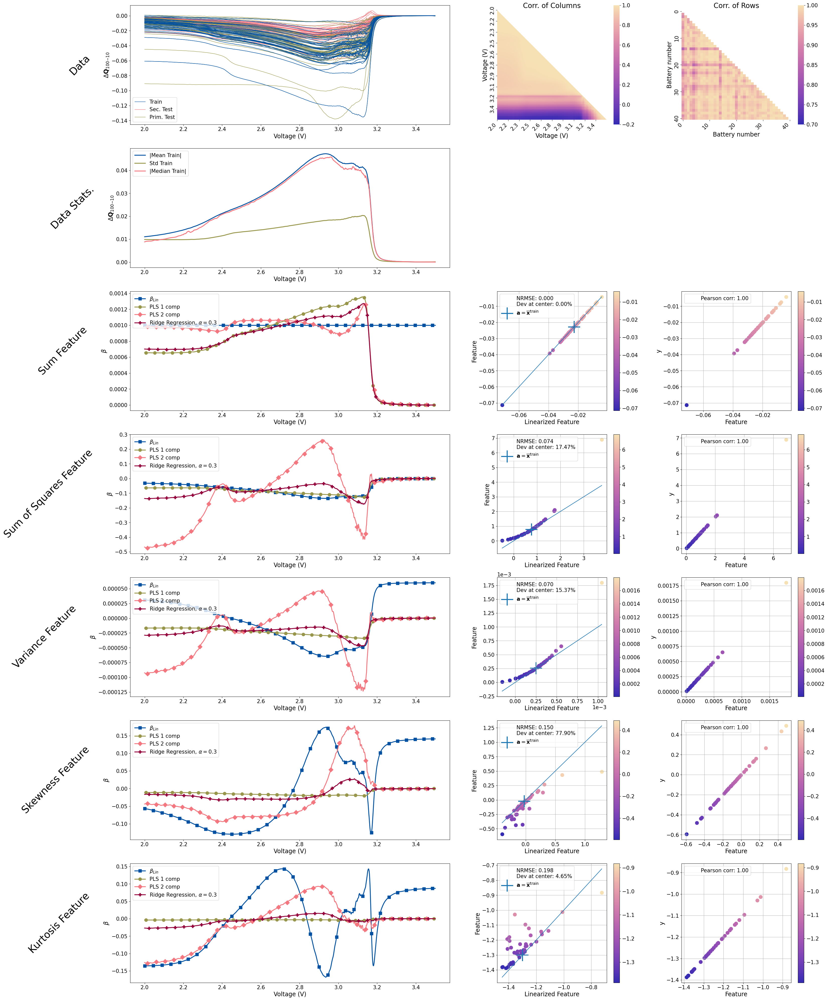

In [31]:
from importlib import reload
reload(src.featlin)
from src.featlin import linearization_plots

models = [
    PLSRegression(n_components=1, tol=1e-7, scale=False),
    PLSRegression(n_components=2, tol=1e-7, scale=False),
    # PLSRegression(n_components=3, tol=1e-7, scale=False), 
    Ridge(alpha=0.3)
]
model_names = [
    'PLS 1 comp',
    'PLS 2 comp',
    # 'PLS 3 comp',
    r'Ridge Regression, $\alpha=0.3$'
]
labels_lfp = {'xdata_label': 'Voltage (V)', 'ydata_label': r'$\Delta \mathbf{Q}_{100\mathrm{-}10}$', 'row_label': 'Battery number'}
fig, axs = linearization_plots(x_lfp,  X_lfp_train, y_lfp_train, fun_targetj, fun_target_names, models, model_names, labels_lfp, cmap, show=False)

# Plot Test, Test 2 into axs[0, 0]\
axs[0, 0].plot(x_lfp, X_lfp_test2[:, :].T, label='Sec. Test', lw=1, color=color_list[2])
axs[0, 0].plot(x_lfp, X_lfp_test[:, :].T, label='Prim. Test', lw=1, color=color_list[1])
axs[0, 0].plot(x_lfp, X_lfp_train[:, :].T, label='Train', lw=1, color=color_list[0])
handles, labels = axs[0, 0].get_legend_handles_labels()
by_label = dict(zip(labels, handles))
axs[0, 0].legend(by_label.values(), by_label.keys(), loc=3)

plt.show()

# RDB What would be useful in your opinoin?
# Insert additional plots for  axs[1, 1] and axs[1, 2] in here. 
# Correlation of each column to y
# Train and test dataset correlations ( one plot per test)


In [32]:
def reject_outliers(data, m = 2.):
    '''
    https://stackoverflow.com/questions/11686720/is-there-a-numpy-builtin-to-reject-outliers-from-a-list
    Answer from Benjamin Bannier
    '''
    d = np.abs(data - np.median(data))
    mdev = np.median(d)
    s = d/mdev if mdev else 0.
    return data[s<m], s<m

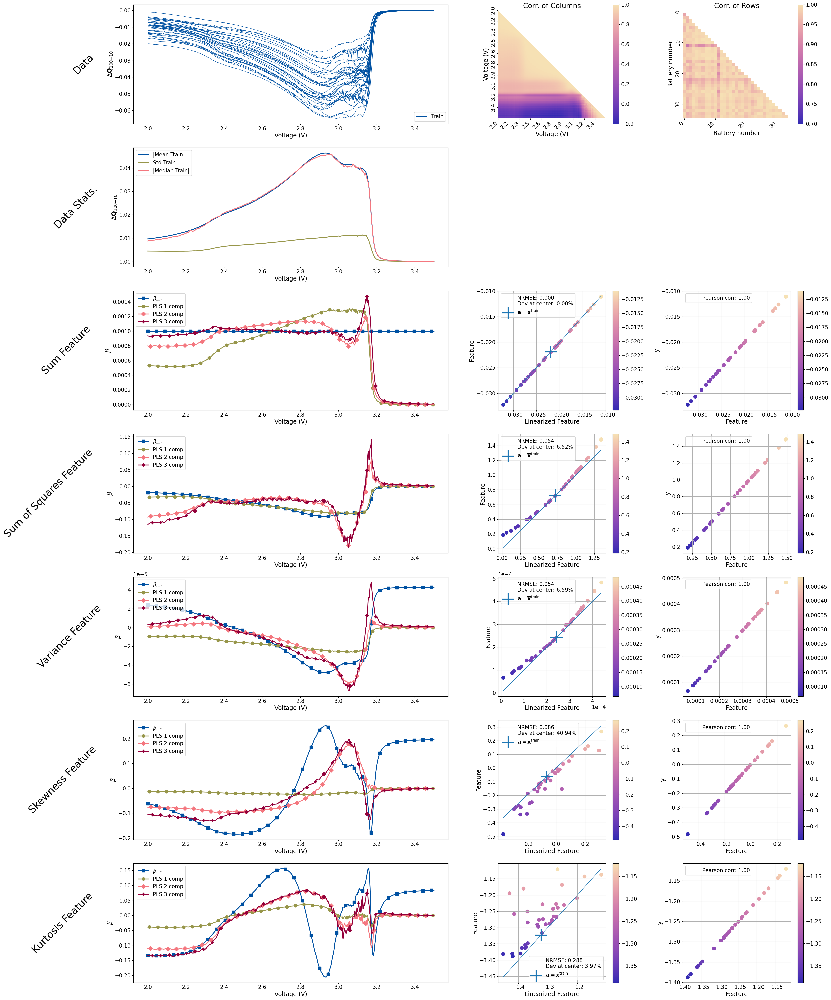

In [33]:
# Now without the outlier's (; 
X_lfp_train_filtered_mean, ind =  reject_outliers(np.mean(X_lfp_train, axis=1), m = 2.5)


models = [
    PLSRegression(n_components=1, tol=1e-7, scale=False),
    PLSRegression(n_components=2, tol=1e-7, scale=False),
    PLSRegression(n_components=3, tol=1e-7, scale=False), 
    #Ridge(alpha=0.3)
]
model_names = [
    'PLS 1 comp',
    'PLS 2 comp',
    'PLS 3 comp',
    #r'Ridge Regression, $\alpha=0.3$'
]

fig, axs = linearization_plots(x_lfp,  X_lfp_train[ind, :], y_lfp_train[ind, :], fun_targetj, fun_target_names, models, model_names, labels_lfp, cmap, show=False)

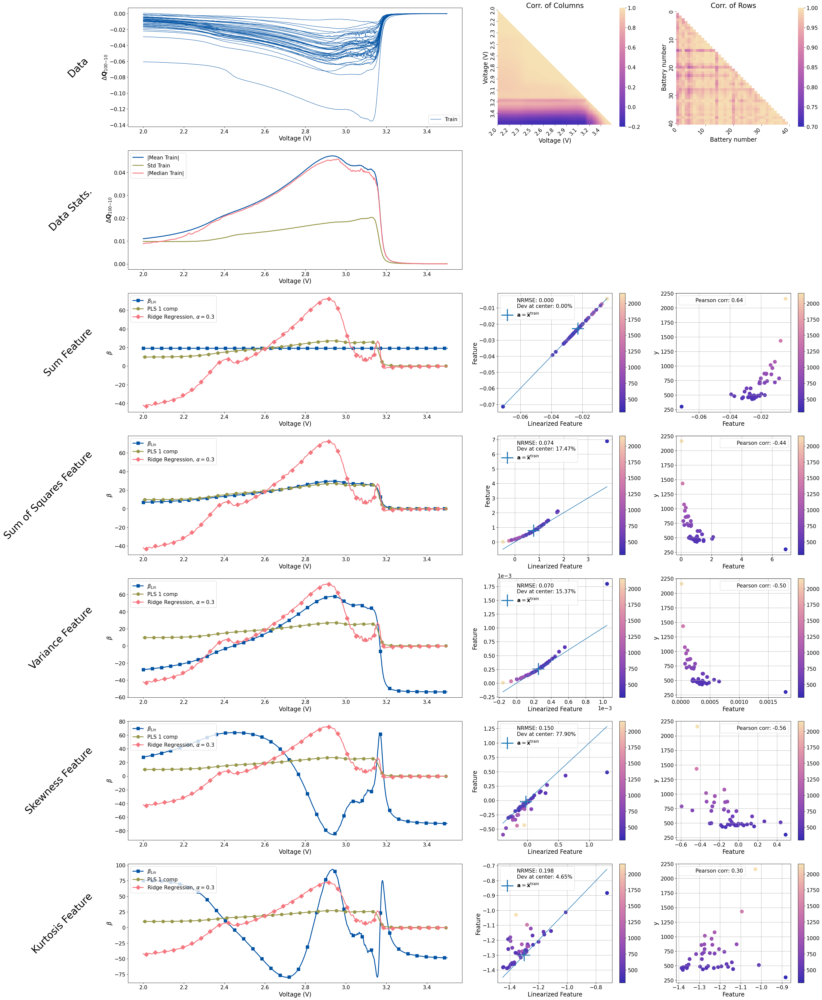

In [54]:
# LFP with real labels (:
reload(src.featlin)
from src.featlin import linearization_plots

models = [
    PLSRegression(n_components=1, tol=1e-7, scale=False),
    # PLSRegression(n_components=2, tol=1e-7, scale=False),
    #PLSRegression(n_components=3, tol=1e-7, scale=False), 
    Ridge(alpha=0.3)
]
model_names = [
    'PLS 1 comp',
    # 'PLS 2 comp',
    #'PLS 3 comp',
    r'Ridge Regression, $\alpha=0.3$'
]

fig, axs = linearization_plots(x_lfp,  X_lfp_train, y_lfp_train_true, fun_targetj, fun_target_names, models, model_names, labels_lfp, cmap, show=False)

# Synthethic dataset results

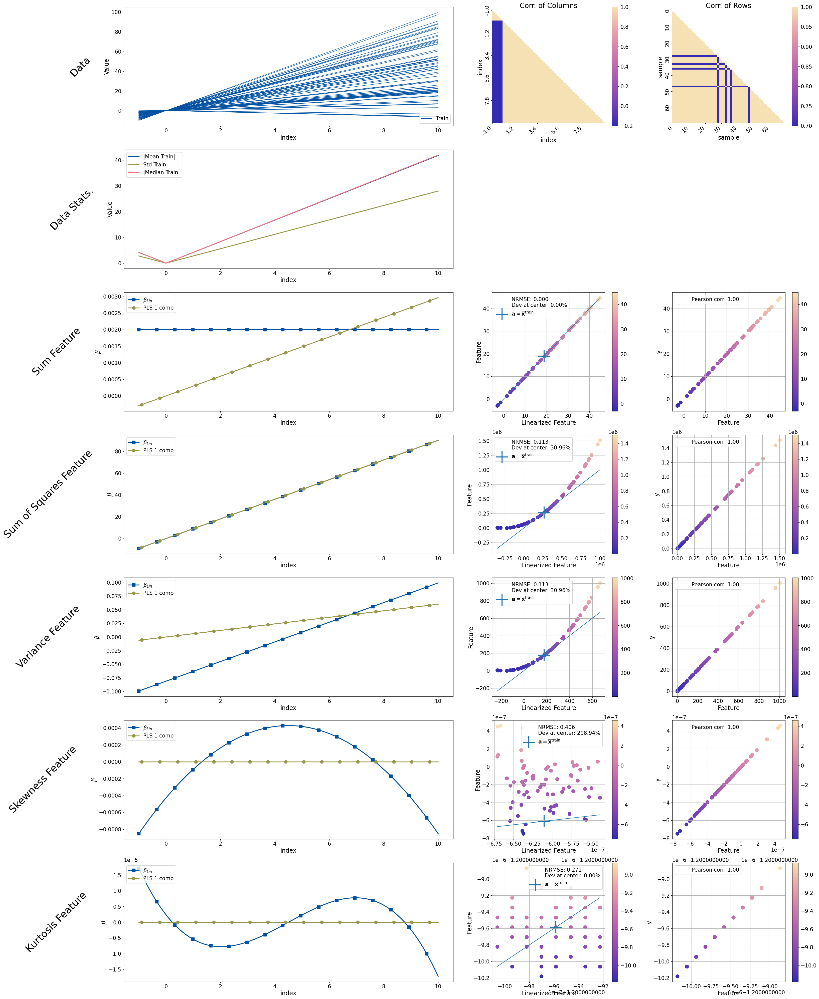

In [34]:
models = [
    PLSRegression(n_components=1, tol=1e-7, scale=False),
]
model_names = [
    'PLS 1 comp',
]
labels_syn = {'xdata_label': 'index', 'ydata_label': 'Value', 'row_label': 'sample'}
fig, axs = linearization_plots(x,  X_train_[:, :, 0], y_train_[:, :, 0], fun_targetj, fun_target_names, models, model_names, labels_syn, cmap)

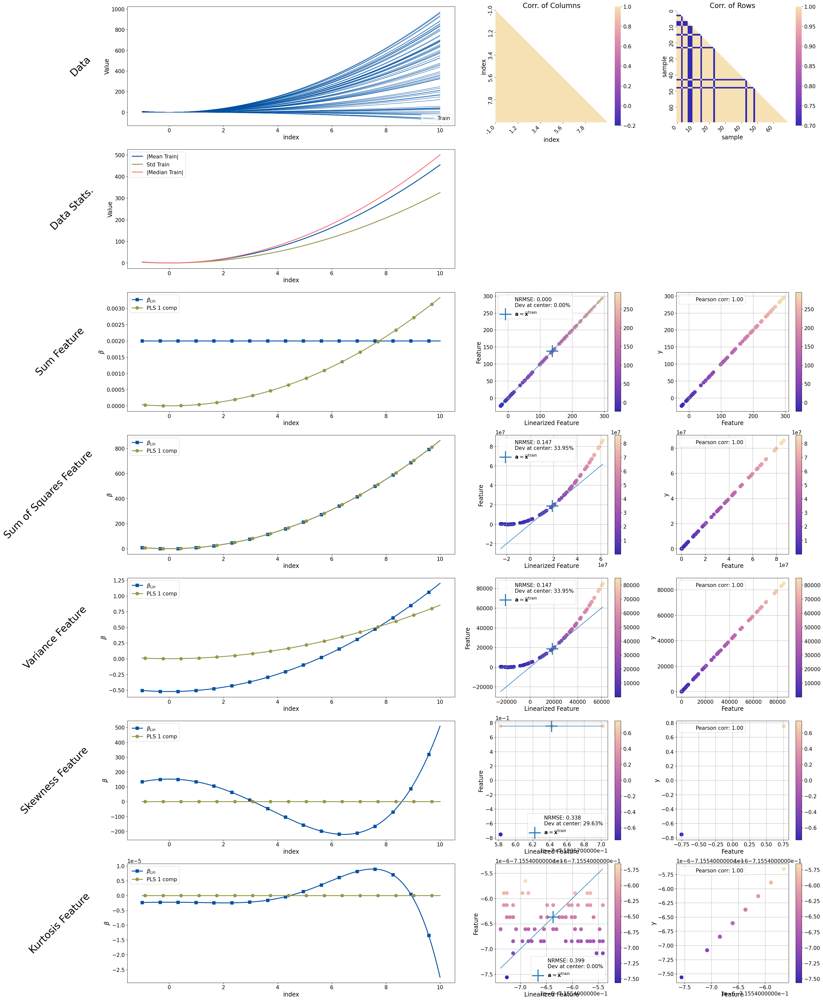

In [35]:
fig, axs = linearization_plots(x,  X_train_[:, :, 1], y_train_[:, :, 1], fun_targetj, fun_target_names, models, model_names, labels_syn, cmap)

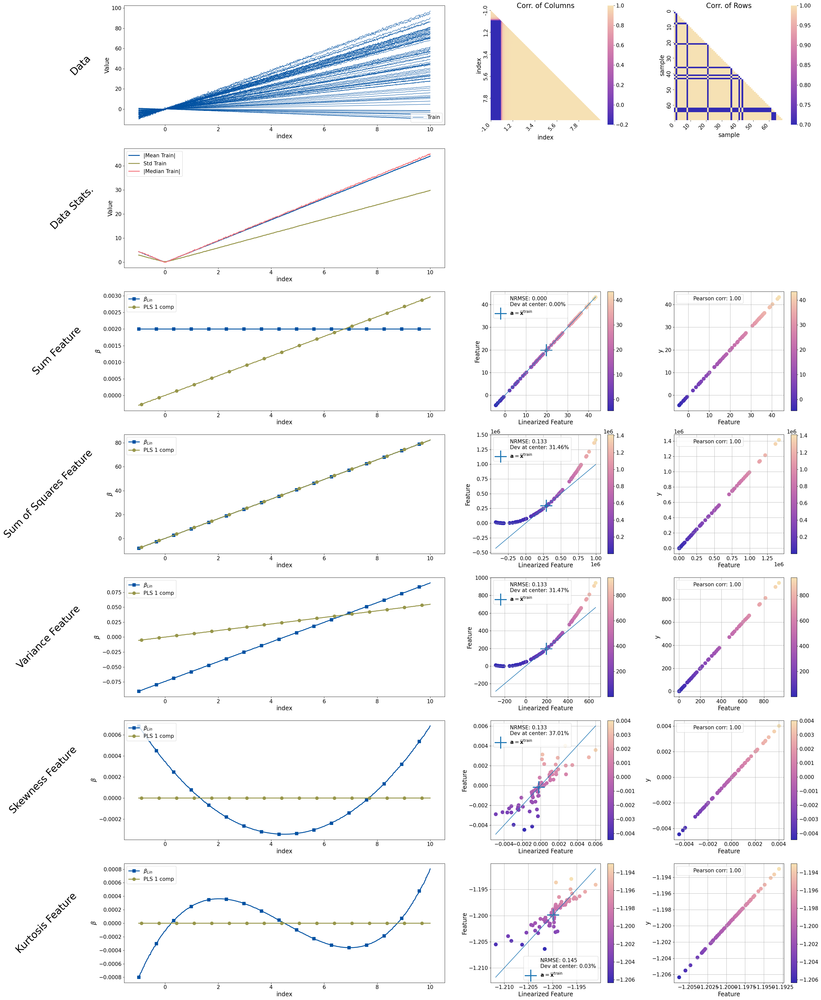

In [36]:
fig, axs = linearization_plots(x,  X_train_[:, :, 2], y_train_[:, :, 2], fun_targetj, fun_target_names, models, model_names, labels_syn, cmap)

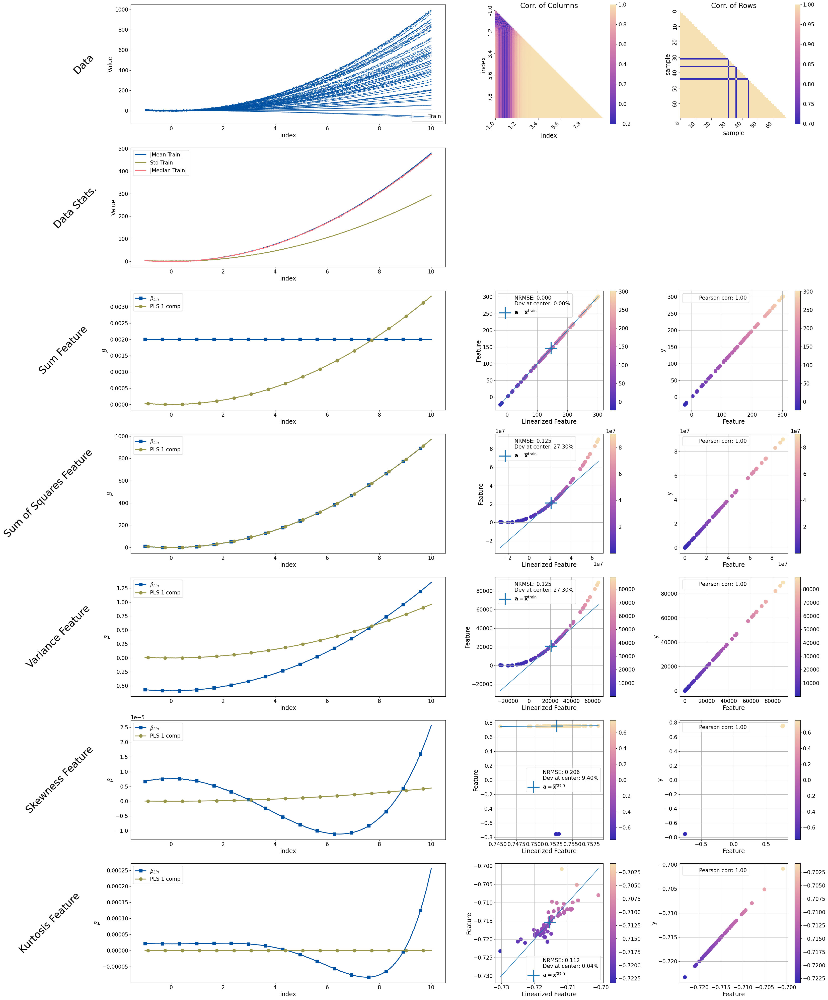

In [37]:
fig, axs = linearization_plots(x,  X_train_[:, :, 3], y_train_[:, :, 3], fun_targetj, fun_target_names, models, model_names, labels_syn, cmap)

In [16]:
def plot_axs(x,  X_train_, X_test_, y_train_, fun_targetj, alpha):
    ''' Function to create plot of data and regression coefficients
    '''
    colors = ['#0051a2', '#97964a', '#f4777f', '#93003a']
    rows = len(fun_targetj) + 2
    columns = X_train_.shape[2]+1
    figsize = [10*columns, 6*rows]

    fig, axs = plt.subplots(rows, columns, figsize=figsize, sharex=True)

    axs[0, 0].plot(x, X_train_[:, :, 0].T, label='Train Data', lw=1, color=colors[0])
    axs[0, 0].plot(x, X_test_[:, :, 0].T, label='Test Data', lw=1, color=colors[1])
    axs[0, 1].plot(x, X_train_[:, :, 0].T, label='Train Data', lw=1, color=colors[0])
    axs[0, 1].plot(x, X_test_[:, :, 0].T, label='Test Data', lw=1, color=colors[1])
    # axs[0, 1].plot(x, X_train_[:, :, 1].T, label='Train Data', lw=1, color=colors[0])
    # axs[0, 1].plot(x, X_test_[:, :, 1].T, label='Test Data', lw=1, color=colors[1])
    # axs[0, 2].plot(x, X_train_[:, :, 2].T, label='Train Data', lw=1, color=colors[0])
    # axs[0, 2].plot(x, X_test_[:, :, 2].T, label='Test Data', lw=1, color=colors[1])
    axs[1, 0].plot(x, np.abs(np.mean(X_train_[:, :, 0].T, axis=1)), label='|Mean Train|', lw=1, color=colors[0])
    axs[1, 0].plot(x, np.std(X_train_[:, :, 0].T, axis=1), label='Std Train', lw=1, color=colors[1])
    axs[1, 1].plot(x, np.abs(np.mean(X_train_[:, :, 0].T, axis=1)), label='|Mean Train|', lw=1, color=colors[0])
    axs[1, 1].plot(x, np.std(X_train_[:, :, 0].T, axis=1), label='Std Train', lw=1, color=colors[1])
    axs[1, 0].legend()
    axs[1, 1].legend()
    
    for i in range(X_train_.shape[2]):
        handles, labels = axs[0, i].get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        axs[0, i].legend(by_label.values(), by_label.keys(), loc=2, fontsize=22)

    for i in range(X_train_.shape[2]):
        for j in range(y_train_.shape[1]):
            X_train = X_train_[:, :, i]
            y_train = y_train_[:, j, i]
            pls1 = PLSRegression(n_components=1, tol=1e-7, scale=False).fit(X_train, y_train-y_train.mean())
            pls2 = PLSRegression(n_components=2, tol=1e-7, scale=False).fit(X_train, y_train-y_train.mean())
            pls3 = PLSRegression(n_components=3, tol=1e-7, scale=False).fit(X_train, y_train-y_train.mean())
            pls4 = PLSRegression(n_components=4, tol=1e-7, scale=False).fit(X_train, y_train-y_train.mean())
            rr = Ridge(alpha=alpha).fit(X_train, y_train-y_train.mean())

            x_hat, lin_coef_, lin_const_coef = regress_linearized_coeff(X_train, y_train, fun_targetj[j])
            axs[j+2, i].plot(x, lin_coef_.reshape(-1), label=r'$\beta_{Lin}$', lw=2.5, color=colors[0], marker="s", markevery=(1, 30),  markersize=9)
            axs[j+2, i+1].plot(x, lin_coef_.reshape(-1), label=r'$\beta_{Lin}$', lw=2.5, color=colors[0], marker="s", markevery=(1, 30),  markersize=9)
            axs[j+2, i].plot(x, pls1.coef_, label=r'$\beta_{PLS}$, 1 Component', lw=2.5, color=colors[1], marker="o", markevery=(10, 30), markersize=9)
            axs[j+2, i].plot(x, pls2.coef_, label=r'$\beta_{PLS}$, 2 Component', lw=2.5, color=colors[2], marker="D", markevery=(15, 30), markersize=9)
            axs[j+2, i+1].plot(x, pls2.coef_, label=r'$\beta_{PLS}$, 2 Component', lw=2.5, color=colors[2], marker="D", markevery=(15, 30), markersize=9)
            axs[j+2, i+1].plot(x, pls3.coef_, label=r'$\beta_{PLS}$, 3 Component', lw=2.5, color=colors[3], marker="D", markevery=(20, 30), markersize=9)
            axs[j+2, i+1].plot(x, pls4.coef_, label=r'$\beta_{PLS}$, 4 Component', lw=2.5, color=colors[1], marker="D", markevery=(25, 30), markersize=9)
            axs[j+2, i].plot(x, rr.coef_, label=r'$\beta_{RR}$  $\lambda=0.5$', lw=2.5, color=colors[3], marker="P", markevery=(20, 30),  markersize=9)
            
            # axs.grid()
            handles1, labels1 = axs[j+1, i].get_legend_handles_labels()
            by_label1 = dict(zip(labels1, handles1))
            handles2, labels2 = axs[j+1, i+1].get_legend_handles_labels()
            by_label2 = dict(zip(labels2, handles2))
            axs[j+2, i].legend(by_label1.values(), by_label1.keys(), loc=2, fontsize=16)
            axs[j+2, i+1].legend(by_label2.values(), by_label2.keys(), loc=2, fontsize=16)
            
            axs[j+2, i].set_title(fun_target_names[j])
            axs[j+2, i+1].set_title(fun_target_names[j])

    plt.tight_layout()
    plt.show()
            
    return None

In [17]:
# IPython Libraries
import IPython
import ipywidgets
from ipywidgets import interact, fixed

scaler = preprocessing.StandardScaler().fit(X_lfp_train)
X_scaled = scaler.transform(X_lfp_train)
interact(plot_axs, x=fixed(np.linspace(3.5, 2.0, 1000)),  X_train_=fixed(np.expand_dims(X_lfp_train, axis=2)), 
        X_test_=fixed(np.expand_dims(X_lfp_test, axis=2)), y_train_=fixed(y_lfp_train), fun_targetj=fixed(fun_targetj),
        alpha=ipywidgets.FloatLogSlider(value = 0.5,
                                    base = 2,
                                    min=-10, 
                                    max=10, 
                                    step=0.0001, 
                                    description='Alpha RR',
                                    continuous_update=True)
                                    )

interactive(children=(FloatLogSlider(value=0.5, base=2.0, description='Alpha RR', max=10.0, min=-10.0, step=0.…

<function __main__.plot_axs(x, X_train_, X_test_, y_train_, fun_targetj, alpha)>

In [18]:
# Why don't the linear methods point into the directions that would be ideal?  
# The effect of 'outliers' on this methods might be significant!

# Even in an ideal world this will not work too well. 
# Reasons: 1. Nullspace of the data, 2. The way of regularization will affed the shape of the coefficiencts a lot. 
# IF there's some linear order, the algorithms will always learn coefficients that have a similar shape as the data!
# How much are the algorithms affected by outliers? 
# How much are the algorithms affected by not standardizing the data
# How much does correlation between columns affect the results? 

# --> Conclusion: Interesting new perspective on interpretation of regression coefficients. 
# How do regression coeffcieints compare with standardizartion and without?

# Negative regression coefficients: This is NOT an issue. Might be simply because of the y-y.mean(). 
# How and when does the sign of regression coefficients flip?


# Conclusions: It can give you some directions that might be interesting. 
# HOWEVER: Regression coefficients often look similar to the data... 
# Why is this the case? 
# --> Because the data is not standardized, we apply an implicicit preference larger weights on regions that with a larger mean/std 
# Thsi regiosn might also contiana more information, but deu to the way how regularization is done, if the regions where the magnitude of the data is smaller 
# doesnt carry significatly more information, those will go to zero//they might be eassier to regularize down.

# Common issues with such datasets: 
# Correlation of columns. 

# Hyperparamter: How to find the right hyperparamter?
# PLS with its integer hyperparamters might not be ideal

# Idea: Tune RR hyperparamter to optimize the fit of th regression coefficient with the feature as a measure. 
# (Metric based on the difference of the prediction, or simpoly apply some nullspace trick)

# You can get around the issue of hyperparamter tuning by only using the first 1 or 2 PLS components.

In [ ]:
# From https://stackoverflow.com/questions/52524919/fourier-series-fit-in-python

# This lets you fit parameters to your data
# Ths could be nice to figure out what type of function might fir certain data well 
# In particular we could make an effort to fit "functions" to the DeltaQ feature,
# Estimate the disributions of their parameters and subsequently sample from those distributions

from symfit import parameters, variables, sin, cos, Fit
import numpy as np
import matplotlib.pyplot as plt

def fourier_series(x, f, n=0):
    """
    Returns a symbolic fourier series of order `n`.

    :param n: Order of the fourier series.
    :param x: Independent variable
    :param f: Frequency of the fourier series
    """
    # Make the parameter objects for all the terms
    a0, *cos_a = parameters(','.join(['a{}'.format(i) for i in range(0, n + 1)]))
    sin_b = parameters(','.join(['b{}'.format(i) for i in range(1, n + 1)]))
    # Construct the series
    series = a0 + sum(ai * cos(i * f * x) + bi * sin(i * f * x)
                     for i, (ai, bi) in enumerate(zip(cos_a, sin_b), start=1))
    return series

x, y = variables('x, y')
w, = parameters('w')
model_dict = {y: fourier_series(x, f=w, n=3)}
print(model_dict)

# Make step function data
xdata = np.linspace(-np.pi, np.pi)
ydata = np.zeros_like(xdata)
ydata[xdata > 0] = 1
# Define a Fit object for this model and data
fit = Fit(model_dict, x=xdata, y=ydata)
fit_result = fit.execute()
print(fit_result)

# Plot the result
plt.plot(xdata, ydata)
plt.plot(xdata, fit.model(x=xdata, **fit_result.params).y, color='green', ls=':')